## Van Eck's sequence
A look at the first 10 million.

#### OIES definition
https://oeis.org/A181391
#### Numberphile
https://www.youtube.com/watch?v=etMJxB-igrc

In [1]:
function A181391(len)
    L = [0, 0]
    for n in 2:len
        k = findlast(m -> L[n] == L[m], 1:n-1)
        push!(L, k == nothing ? 0 : n - k)
    end
    L 
end

A181391 (generic function with 1 method)

In [8]:
#First 25 numbers in sequence
A181391(25)

26-element Array{Int64,1}:
 0
 0
 1
 0
 2
 0
 2
 2
 1
 6
 0
 5
 0
 2
 6
 5
 4
 0
 5
 3
 0
 3
 2
 9
 0
 4

In [10]:
using Pkg; Pkg.add("Plots")
using Plots

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
Fetching: [========================================>]  100.0 %.0 %Fetching: [======>                                  ]  14.2 %>                            ]  29.8 %Fetching: [===================>                     ]  45.5 %               ]  61.1 %Fetching: [==========================>              ]  64.6 %       ]  80.2 % [=======================================> ]  96.0 % Resolving package versions...
 Installed DataValueInterfaces ─ v1.0.0
 Installed Showoff ───────────── v0.3.1
 Installed Tables ────────────── v0.2.7
 Installed BinaryProvider ────── v0.5.5
 Installed IterTools ─────────── v1.2.0
 Installed DataStructures ────── v0.17.0
 Installed StatsBase ─────────── v0.31.0
  Updating `~/.julia/environments/v1.1/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.1/Manifest.toml`
  [b99e7846] ↑ BinaryProvider v0.5.4 ⇒ v0.5.5
  [864edb3b] ↑ Data

┌ Info: Recompiling stale cache file /Users/thomasmellan/.julia/compiled/v1.1/Plots/ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1184


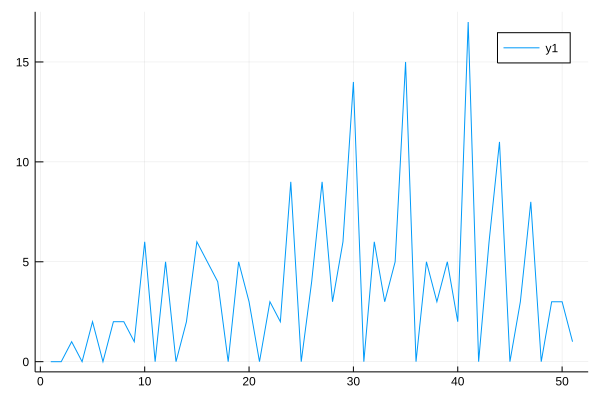

In [22]:
#Plot first 50 numbers
plot(A181391(50))

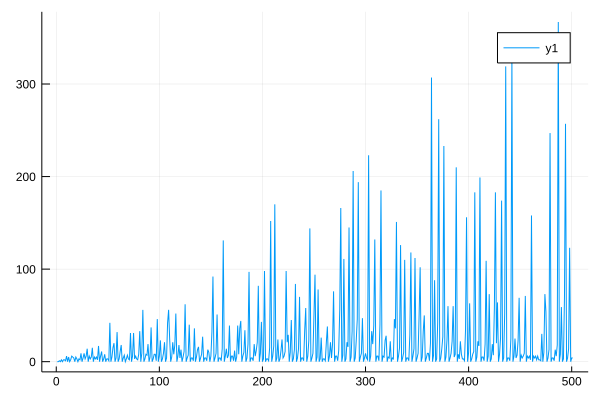

In [20]:
#Plot first 500 numbers
plot(A181391(500))

In [6]:
# Check how long it takes to compute up the first million vanEck numbers
for i in 1:6
    
    @time vanEck = A181391(10^i);
    
end

  0.000002 seconds (4 allocations: 368 bytes)
  0.000004 seconds (7 allocations: 2.219 KiB)
  0.000110 seconds (10 allocations: 16.406 KiB)
  0.008408 seconds (14 allocations: 256.656 KiB)
  0.650502 seconds (17 allocations: 2.001 MiB)
 64.003831 seconds (20 allocations: 9.001 MiB)


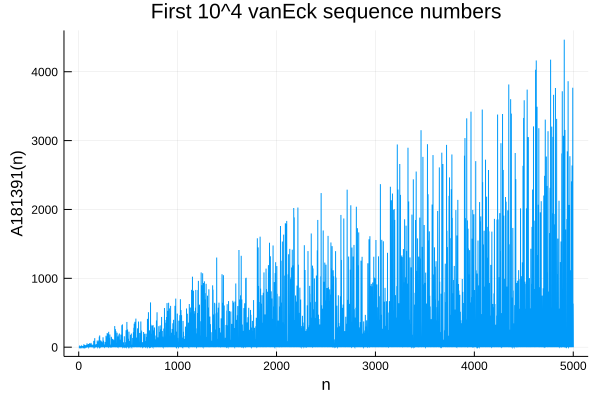

In [17]:

plot(A181391(5000),title="First 10^4 vanEck sequence numbers",label=[""],ylabel="A181391(n)",xlabel="n")


In [297]:
#After about 10^5, it is a bit too much to plot to see any structure.
#Let's make a modified version of A181391(n) that just reports the high points vs n.


#High points(n) as 1D array
#Note, arg is the van Eck sequence
function get_highs(arg)
    highs = [0.0]
    max = 0
    for n in 2:length(arg)
        
        if arg[n] > max 
            max = arg[n]
            push!(highs, max)
        else
            push!(highs, 0.0)
        end
            
    end
    highs
end

#[High points, n] 2d array
function get_highs_arr(arg)
    highs = [0.0]
    nVals = [1]
    max = 0
    for n in 2:length(arg)
        
        if arg[n] > max 
            max = arg[n]
            push!(highs, max)
            push!(nVals, n)
        end
            
    end
    highs_arr = [[nVals]; [highs]]
end

# High points / n 
function get_highs_ratio(arg)
    highs_ratio = [0.0]
    max = 0
    for n in 2:length(arg)
        
        if arg[n] > max 
            max = arg[n]
            push!(highs_ratio, convert(Float64, max)/convert(Float64, n))
        end
            
    end
    highs_ratio
end


get_highs_ratio (generic function with 1 method)

In [305]:
#Compute the first 10 million van Eck numbers (this might be slow!)
@time d_A181391 = A181391(10000000);
#Get the high points vs n
@time d_A181391_highs = get_highs(d_A181391);
#[High points, n] array
@time d_A181391_highs_arr = get_highs_arr(d_A181391);
#High points/n ratio
@time d_A181391_highs_ratio = get_highs_ratio(d_A181391);

7484.120653 seconds (28 allocations: 129.001 MiB, 0.00% gc time)
  0.247402 seconds (28 allocations: 129.001 MiB, 34.08% gc time)
  0.009437 seconds (29 allocations: 39.156 KiB)
  0.006736 seconds (14 allocations: 16.563 KiB)


In [302]:
#High points just keep getting higher,  looks almost linear
plot(d_A181391_highs)

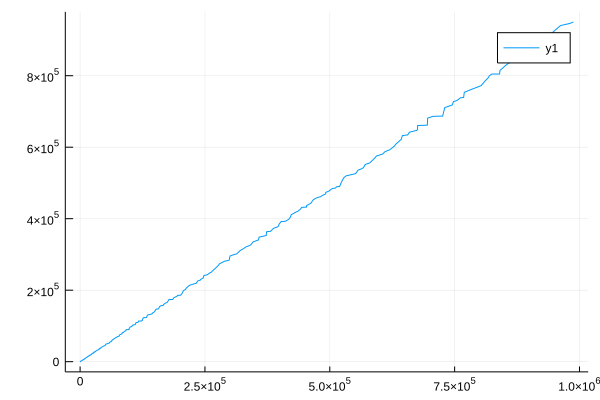

In [303]:
#High points vs n, basically linear
plot(d_A181391_highs_arr[1],d_A181391_highs_arr[2])


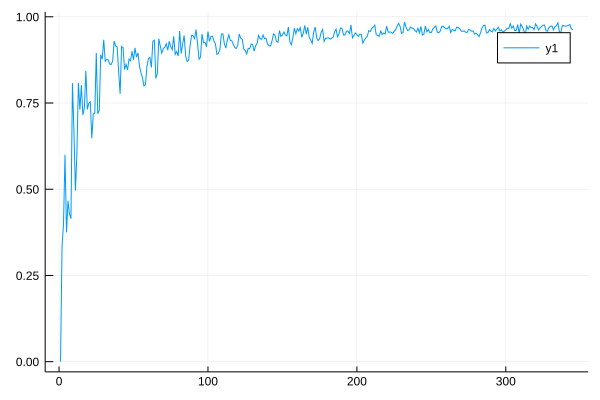

In [304]:
#High points / n looks like converges to one.
plot(d_A181391_highs_ratio)